## 5420 Anomaly Detection, Fall 2020

#### Assignment 11: SHAP Values using Randon Forest
https://courseworks2.columbia.edu/courses/120274/assignments/503952?module_item_id=1036289

Submitted by:
Harsh Dhanuka, hd2457

## Objectives

It is important in any data science project to define the objective as specific as possible. Below let's write it from general to specific. This will direct our analysis.

* Build a model for Loan Default Prediction, to interpret the SHAP values
* Build a model for Loan Default Prediction, to interpret the SHAP values of the variables, using the top few variables as discovered in the previous RF and GBM models.
* Build a model for Loan Default Prediction, to interpret the SHAP values of the variables, by running the Random Forest model from sklearn package.
* Build a model for Loan Default Prediction, to interpret  the SHAP values of the variables, and  display the following charts: The summary_plot, The dependence_plot, The force_plot for 4 individual observations

### Please click Section 4 to directly go to the RF Model and SHAP Values


## Table of Contents

Section 1: Initial Steps

* [Section 1: Initial Steps](#Section_1)
    * [Section 1.1: Load Data](#Section_11)
    * [Section 1.2: Basic Summary Check](#Section_12)
    * [Section 1.3: Basic EDA and considerations](#Section_13)
    
    
Section 2: Data Cleaning and Preparation, Feature Engineering

* [Section 2: Data Cleaning and Preparation, Feature Engineering](#Section_2)
    * [Section 2.1: Convert the DateTime column AP005 to the relevant formats of Year, Month, Day](#Section_21)
    * [Section 2.2: Convert the misrepresented numerical categorical variables back to relevant category/object format](#Section_22)    
    * [Section 2.3: Drop all blank value and id columns](#Section_23)
    * [Section 2.4: Convert all the negative or mis-read values such as -99, etc, to 'nan' for imputation](#Section_24)
    * [Section 2.5: Fill NA's using Iterative Imputer](#Section_25)
    * [Section 2.6: Convert the loan amount column CR009 to a category variable and bin appropriately](#Section_26)    


Section 3: EDA of all variables and binning

* [Section 3: EDA and binning](#Section_3)
    * [Section 3.1: Check the Correlation using correlation plot](#Section_31)
    * [Section 3.2: Create categorical variables using qcut, and assign function to bin all continuous variables](#Section_32)
    * [Section 3.3: Distributions of the numerical data, and the % Y by X which is the mean column for all the Nategorical columns here](#Section_33)
    * [Section 3.4: Distributions of the categorical data, and the % Y by X which is the mean column for all the Categorical columns here](#Section_34)
    * [Section 3.5: EDA - Showing the distribution of X](#Section_35)
    * [Section 3.6: EDA - Showing the Distribution of Y by another Categorical Variable X](#Section_36)
    * [Section 3.7: EDA - Showing interaction of 2 or 3 variables](#Section_37)


Section 4: RF Model and SHAP Value Plots

* [Section 4: Build RF Model and find SHAP Values](#Section_4)
    * [Section 4.1: RF Model using sklearn](#Section_41)
    * [Section 4.2: SHAP Values and SHAP Visualizations](#Section_42)
        * [Section 4.2.1: Global Interpretation - SHAP Variable Importance Plot](#Section_421)
        * [Section 4.2.2: Global Interpretation - SHAP Summary Plot](#Section_422)
        * [Section 4.2.3: Global Interpretation - SHAP Variable Dependence Plot](#Section_423)
        * [Section 4.2.4: Local Interpretation - Individual SHAP Value Plot (Force Plot)](#Section_424)

Section 5: Future Considerations, LIME Model, Conclusion

* [Section 5: Future Considerations, LIME Model, Conclusion](#Section_5)


### SHAP VALUES:

SHAP Values (an acronym from SHapley Additive exPlanations) break down a prediction to show the impact of each feature. It is a method to explain individual predictions. SHAP is based on the game theoretically optimal Shapley Values. Where could we use this?
- A model says a bank shouldn't loan someone money, and the bank is legally required to explain the basis for each loan rejection (whish is what we will be doing in this assignment)
- A healthcare provider wants to identify what factors are driving each patient's risk of some disease so they can directly address those risk factors with targeted health interventions

Lundberg and Lee (2016) proposed the SHAP value as a united approach to explaining the output of any machine learning model. Three benefits worth mentioning here.
- The first one is global interpretability — the collective SHAP values can show how much each predictor contributes, either positively or negatively, to the target variable. This is like the variable importance plot but it is able to show the positive or negative relationship for each variable with the target (see the SHAP value plot below).
- The second benefit is local interpretability — each observation gets its own set of SHAP values (see the individual SHAP value plot below). This greatly increases its transparency. We can explain why a case receives its prediction and the contributions of the predictors. Traditional variable importance algorithms only show the results across the entire population but not on each individual case. The local interpretability enables us to pinpoint and contrast the impacts of the factors.
- Third, the SHAP values can be calculated for any tree-based model, while other methods use linear regression or logistic regression models as the surrogate models.



SHAP Plot Variable Explanation
![SHAP Plot](https://miro.medium.com/max/856/1*d5mdjPD7LLQLZEnX7cGR5w.png)



# 1. Initial Steps <a class="anchor" id="Section_1"></a>

In [1]:
# Import all packages
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt 
%matplotlib inline
import scipy
import time
import seaborn as sns
sns.set(style="whitegrid")
import warnings
warnings.filterwarnings("ignore")

from sklearn.impute import SimpleImputer
from sklearn import preprocessing
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn import metrics
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.metrics import roc_curve, auc, roc_auc_score, accuracy_score, confusion_matrix
from sklearn.metrics import average_precision_score
from sklearn.metrics import precision_recall_curve
from sklearn.ensemble import RandomForestRegressor

import plotly
import plotly.express as px

from collections import Counter

## 1.1. Load Data  <a class="anchor" id="Section_11"></a>

In [2]:
# Read the data
df = pd.read_csv('/Users/harshdhanuka/Desktop/Columbia Class Matter/SEM 3/5420 Anomaly Detection/Assignment 2 EDA/XYZloan_default_selected_vars.csv')
df.head(2)

,Unnamed: 0,Unnamed: 0.1,id,loan_default,AP001,AP002,AP003,AP004,AP005,AP006,...,CD162,CD164,CD166,CD167,CD169,CD170,CD172,CD173,MB005,MB007
0,0,1,1,1,31,2,1,12,2017/7/6 10:21,ios,...,13.0,13.0,0.0,0.0,1449.0,1449.0,2249.0,2249.0,7.0,IPHONE7
1,1,2,2,0,27,1,1,12,2017/4/6 12:51,h5,...,-99.0,-99.0,-99.0,-99.0,-99.0,-99.0,-99.0,-99.0,NaN,WEB


## 1.2. Basic Summary Check <a class="anchor" id="Section_12"></a>

In [3]:
print("Number of rows and columns in the dataset:")
df.shape

Number of rows and columns in the dataset:


(80000, 89)

In [4]:
# Check basic statistics
print("Basic statistics of the columns are as follows:")
df.describe()

Basic statistics of the columns are as follows:


,Unnamed: 0,Unnamed: 0.1,id,loan_default,AP001,AP002,AP003,AP004,AP007,AP008,...,CD160,CD162,CD164,CD166,CD167,CD169,CD170,CD172,CD173,MB005
count,80000.000000,80000.000000,80000.000000,80000.000000,80000.000000,80000.000000,80000.000000,80000.000000,80000.00000,80000.000000,...,79619.000000,79619.000000,79619.000000,79619.000000,79619.000000,79619.000000,79619.00000,79619.000000,79619.000000,77207.000000
mean,39999.500000,40000.500000,40000.500000,0.193600,31.706913,1.321813,2.014925,11.235413,3.30130,3.117200,...,6.911956,14.271694,11.773358,909.089313,810.786219,1732.693314,1539.33443,2513.226491,2229.606137,5.976272
std,23094.155105,23094.155105,23094.155105,0.395121,7.075070,0.467174,1.196806,2.212313,1.33655,1.306335,...,28.007499,38.235012,33.270641,1379.553332,1245.044602,2441.503517,2172.71384,3404.975112,3005.615048,3.641814
min,0.000000,1.000000,1.000000,0.000000,20.000000,1.000000,1.000000,3.000000,1.00000,1.000000,...,-99.000000,-99.000000,-99.000000,-99.000000,-99.000000,-99.000000,-99.00000,-99.000000,-99.000000,0.000000
25%,19999.750000,20000.750000,20000.750000,0.000000,27.000000,1.000000,1.000000,12.000000,2.00000,2.000000,...,2.000000,5.000000,4.000000,84.000000,34.000000,309.000000,226.00000,539.000000,414.000000,3.000000
50%,39999.500000,40000.500000,40000.500000,0.000000,30.000000,1.000000,1.000000,12.000000,3.00000,3.000000,...,7.000000,12.000000,10.000000,475.000000,397.000000,1023.000000,870.00000,1553.000000,1324.000000,5.000000
75%,59999.250000,60000.250000,60000.250000,0.000000,35.000000,2.000000,3.000000,12.000000,5.00000,4.000000,...,14.000000,23.000000,20.000000,1209.000000,1080.000000,2287.000000,2030.00000,3296.000000,2936.000000,8.000000
max,79999.000000,80000.000000,80000.000000,1.000000,56.000000,2.000000,6.000000,12.000000,5.00000,5.000000,...,1061.000000,2792.000000,1579.000000,48585.000000,29664.000000,88364.000000,54651.00000,125352.000000,87312.000000,47.000000


## 1.3. Basic EDA and considerations <a class="anchor" id="Section_13"></a>

### a. Basic EDA of one variable `AP006`

h5         44246
ios        17159
android    17140
api         1455
Name: AP006, dtype: int64

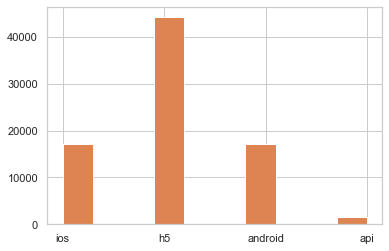

In [5]:
df['AP006'].hist()
df.AP006.hist()
df['AP006'].value_counts()

### b. EDA of the target variable `loan_default`

The number of 0's and 1's are:
0    64512
1    15488
Name: loan_default, dtype: int64


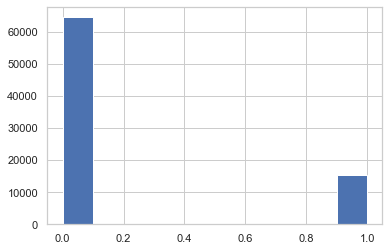

In [6]:
# Check the target variable column
print("The number of 0's and 1's are:")
print(df['loan_default'].value_counts())

df['loan_default'].hist()

### c. Check the column data types, and NA's

In [7]:
#df.info()

### d. Feature considerations from eyeballing the data types

1. The first 3 variables are ID columns, cannot be used for predictions.
`Unnamed: 0`, `Unnamed: 0.1` and `id`. 

They need to be dropped.

2. `AP005` is a Date-Time column, which cannot be used for any predictions in the model. Date-Time columns act as an ID column and all have unique values, which misrepresents the variable while making predictions. The reason is that this field almost becomes a unique identifier for each record. It is as if you employ the ‘id’ field in your decision trees. 

I will derive year, month, day, weekday, etc. from this field. In some models, we may use ‘year’ as a variable just to explain any special volatility in the past. But we will never use the raw DateTime field as a predictor.
 
3. The following columns have 0 as their value in all entries, and hence, they need to be removed from any model predictions. 

`TD025`, `TD026`, `TD027`, `TD028`, `CR012`.

4. The following columns have the same value in all entries, and hence, they need to be removed from any model predictions.

`TD029`, `TD044`, `TD048`, `TD051`, `TD054`, `TD055`, `TD061`, `TD062`.

5. Check for categorical fields from the data variable descriptions. Convert the relevant numeric fields to their respective categorical fields:

`AP002`Gender,
`AP003`Education Code,
`AP004`Loan Term,
`AP006`OS Type,
`AP007`Application City Level,
`AP008`Flag if City not Application City,
`AP009` Binary format,
`MB007` Mobile Brands/type

.

## ------------------------------------  SECTION BREAK  ------------------------------------

.

# 2. Data Cleaning and Preparation, Feature Engineering <a class="anchor" id="Section_2"></a>

## 2.1. Convert the DateTime column `AP005` to the relevant formats of Year, Month, Day  <a class="anchor" id="Section_21"></a>

In [8]:
df['AP005'] =  pd.to_datetime(df['AP005'])

In [9]:
# Create 4 new columns
df['Loan_app_day_name'] = df['AP005'].dt.day_name()
df['Loan_app_month'] = df['AP005'].dt.month_name()
df['Loan_app_time'] = df['AP005'].dt.time
df['Loan_app_day'] = df['AP005'].dt.day

In [10]:
# Drop old column
df = df.drop(columns = ['AP005']) 
df.head(2)

,Unnamed: 0,Unnamed: 0.1,id,loan_default,AP001,AP002,AP003,AP004,AP006,AP007,...,CD169,CD170,CD172,CD173,MB005,MB007,Loan_app_day_name,Loan_app_month,Loan_app_time,Loan_app_day
0,0,1,1,1,31,2,1,12,ios,3,...,1449.0,1449.0,2249.0,2249.0,7.0,IPHONE7,Thursday,July,10:21:00,6
1,1,2,2,0,27,1,1,12,h5,5,...,-99.0,-99.0,-99.0,-99.0,NaN,WEB,Thursday,April,12:51:00,6


## 2.2. Convert the misrepresented numerical categorical variables back to relevant category/object format <a class="anchor" id="Section_22"></a>

In [11]:
df["AP002"] = df["AP002"].astype('object')

df["AP003"] = df["AP003"].astype('object')
df["AP004"] = df["AP004"].astype('object')
df["AP006"] = df["AP006"].astype('object')
df["AP007"] = df["AP007"].astype('object')
df["AP008"] = df["AP008"].astype('object')
df["AP009"] = df["AP009"].astype('object')

df["CR015"] = df["CR015"].astype('object')

df["MB007"] = df["MB007"].astype('object')

df['Loan_app_day_name'] = df['Loan_app_day_name'].astype('object')
df['Loan_app_month'] = df['Loan_app_month'].astype('object')
df['Loan_app_time'] = df['Loan_app_time'].astype('object')
df['Loan_app_day'] = df['Loan_app_day'].astype('object')

## 2.3. Drop all blank value/id columns  <a class="anchor" id="Section_23"></a>

In [12]:
df = df.drop(columns = ['Unnamed: 0', 'Unnamed: 0.1', 'id', 'TD025', 'TD026', 'TD027', 'TD028', 'CR012','TD029', 'TD044', 'TD048', 'TD051', 'TD054', 'TD055', 'TD061', 'TD062']) 
df.head(2)

,loan_default,AP001,AP002,AP003,AP004,AP006,AP007,AP008,AP009,TD001,...,CD169,CD170,CD172,CD173,MB005,MB007,Loan_app_day_name,Loan_app_month,Loan_app_time,Loan_app_day
0,1,31,2,1,12,ios,3,3,1,1,...,1449.0,1449.0,2249.0,2249.0,7.0,IPHONE7,Thursday,July,10:21:00,6
1,0,27,1,1,12,h5,5,4,0,2,...,-99.0,-99.0,-99.0,-99.0,NaN,WEB,Thursday,April,12:51:00,6


## 2.4. Convert all the negative or mis-read values such as -99, etc, to 'nan' for imputation  <a class="anchor" id="Section_24"></a>

As per all the variable description, all the following columns are either counts, lengths, or days. Hence, the negative values such as -999, -99, -98, -1, etc are all mis-read NA's and need to be converted back to 'nan' format.

In [13]:
features_nan = ['AP001',
                'TD001', 'TD002', 'TD005', 'TD006', 'TD009', 'TD010',
       'TD013', 'TD014', 'TD015', 'TD022', 'TD023', 'TD024', 'CR004', 'CR005',
       'CR017', 'CR018', 'CR019', 'PA022', 'PA023', 'PA028',
       'PA029', 'PA030', 'PA031', 'CD008', 'CD018', 'CD071', 'CD072', 'CD088',
       'CD100', 'CD101', 'CD106', 'CD107', 'CD108', 'CD113', 'CD114', 'CD115',
       'CD117', 'CD118', 'CD120', 'CD121', 'CD123', 'CD130', 'CD131', 'CD132',
       'CD133', 'CD135', 'CD136', 'CD137', 'CD152', 'CD153', 'CD160', 'CD162',
       'CD164', 'CD166', 'CD167', 'CD169', 'CD170', 'CD172', 'CD173', 'MB005']

In [14]:
# Define a function to convert negatives to nan
def convert_to_nan(var):
    df[var][df[var] < 0] = np.nan

In [15]:
for i in features_nan:
    convert_to_nan(i)

In [16]:
# Verify that the negatives are gone
print("The minimum now stands at 0 for most of the columns, verifying the mis-represented values are gone.")
df[features_nan].describe()

The minimum now stands at 0 for most of the columns, verifying the mis-represented values are gone.


,AP001,TD001,TD002,TD005,TD006,TD009,TD010,TD013,TD014,TD015,...,CD160,CD162,CD164,CD166,CD167,CD169,CD170,CD172,CD173,MB005
count,80000.000000,80000.000000,80000.000000,80000.000000,80000.000000,80000.00000,80000.000000,80000.000000,80000.000000,80000.000000,...,76312.000000,76312.000000,76312.000000,76312.000000,76312.000000,76312.000000,76312.000000,76312.000000,76312.000000,77207.000000
mean,31.706913,1.986962,0.706213,3.593037,1.345700,5.40600,2.020812,6.804737,2.603662,0.718775,...,11.501677,19.180352,16.573750,952.775121,850.212037,1812.070212,1610.332071,2626.427993,2330.516878,5.976272
std,7.075070,1.807445,0.918347,2.799570,1.413362,4.02311,1.973988,5.128183,2.505840,0.882962,...,17.641851,30.743372,24.496918,1392.729146,1256.936168,2463.242747,2191.780118,3433.330482,3029.857757,3.641814
min,20.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,27.000000,1.000000,0.000000,2.000000,0.000000,3.00000,1.000000,3.000000,1.000000,0.000000,...,3.000000,6.000000,5.000000,123.000000,76.000000,382.000000,294.000000,649.000000,512.000000,3.000000
50%,30.000000,2.000000,0.000000,3.000000,1.000000,4.00000,2.000000,6.000000,2.000000,0.000000,...,7.000000,13.000000,11.000000,518.000000,437.000000,1098.000000,940.000000,1658.000000,1423.000000,5.000000
75%,35.000000,3.000000,1.000000,5.000000,2.000000,7.00000,3.000000,9.000000,4.000000,1.000000,...,14.000000,24.000000,21.000000,1258.000000,1123.000000,2369.000000,2107.000000,3417.000000,3037.000000,8.000000
max,56.000000,20.000000,11.000000,24.000000,21.000000,46.00000,35.000000,52.000000,43.000000,7.000000,...,1061.000000,2792.000000,1579.000000,48585.000000,29664.000000,88364.000000,54651.000000,125352.000000,87312.000000,47.000000


## 2.5. Fill the NA's using Iterative Imputer <a class="anchor" id="Section_25"></a>

Multivariate imputer that estimates each feature from all the others. A strategy for imputing missing values by modeling each feature with missing values as a function of other features in a round-robin fashion.

#### Instead of using the traditional simple mean, median or mode method of imputation, I will be using the smart method of Iterative Imputation from sklearn package.

The documentation is here: https://scikit-learn.org/stable/modules/generated/sklearn.impute.IterativeImputer.html

In [17]:
from sklearn.experimental import enable_iterative_imputer  # noqa
from sklearn.impute import IterativeImputer

#### Make a subset of the original df with only the numeric/float64  variables which have the NA's

In [18]:
df_2 = df[features_nan]

In [19]:
# Verify

df_2.head(3)

,AP001,TD001,TD002,TD005,TD006,TD009,TD010,TD013,TD014,TD015,...,CD160,CD162,CD164,CD166,CD167,CD169,CD170,CD172,CD173,MB005
0,31,1,1,4,1,5,1,14,2,2,...,8.0,13.0,13.0,0.0,0.0,1449.0,1449.0,2249.0,2249.0,7.0
1,27,2,0,3,1,3,1,3,2,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,33,2,1,4,1,5,1,9,1,2,...,0.0,3.0,2.0,33.0,0.0,33.0,0.0,143.0,110.0,8.0


#### 'MEDIAN' imputation through iterative imputer

In [20]:
imp = IterativeImputer(missing_values=np.nan, sample_posterior=False, 
                                 max_iter=10, tol=0.001, 
                                 n_nearest_features=None, initial_strategy='median')
imp.fit(df_2)

IterativeImputer(initial_strategy='median')

In [21]:
imputed_data_median = pd.DataFrame(data=imp.transform(df_2), 
                             columns=['AP001',
                'TD001', 'TD002', 'TD005', 'TD006', 'TD009', 'TD010',
       'TD013', 'TD014', 'TD015', 'TD022', 'TD023', 'TD024', 'CR004', 'CR005',
       'CR017', 'CR018', 'CR019', 'PA022', 'PA023', 'PA028',
       'PA029', 'PA030', 'PA031', 'CD008', 'CD018', 'CD071', 'CD072', 'CD088',
       'CD100', 'CD101', 'CD106', 'CD107', 'CD108', 'CD113', 'CD114', 'CD115',
       'CD117', 'CD118', 'CD120', 'CD121', 'CD123', 'CD130', 'CD131', 'CD132',
       'CD133', 'CD135', 'CD136', 'CD137', 'CD152', 'CD153', 'CD160', 'CD162',
       'CD164', 'CD166', 'CD167', 'CD169', 'CD170', 'CD172', 'CD173', 'MB005'],
                             dtype='int')

In [22]:
imputed_data_median.head(3)

,AP001,TD001,TD002,TD005,TD006,TD009,TD010,TD013,TD014,TD015,...,CD160,CD162,CD164,CD166,CD167,CD169,CD170,CD172,CD173,MB005
0,31,1,1,4,1,5,1,14,2,2,...,8,13,13,0,0,1449,1449,2249,2249,7
1,27,2,0,3,1,3,1,3,2,0,...,7,13,10,531,465,1086,939,1651,1425,5
2,33,2,1,4,1,5,1,9,1,2,...,0,3,2,33,0,33,0,143,110,8


## 2.6. Convert the loan amount column `CR009` to a category variable and bin appropriately <a class="anchor" id="Section_26"></a>

In [23]:
df['CR009'] = pd.cut(x=df['CR009'], bins=[-1, 100000, 200000, 300000, 400000, 500000, 600000, 700000, 800000, 900000, 1000000, 1500000])
df = df.astype({'CR009':'object'})

In [24]:
df.CR009.value_counts()

(-1, 100000]          74142
(100000, 200000]       4125
(200000, 300000]        975
(300000, 400000]        353
(400000, 500000]        166
(500000, 600000]         95
(600000, 700000]         48
(700000, 800000]         32
(1000000, 1500000]       31
(800000, 900000]         19
(900000, 1000000]        14
Name: CR009, dtype: int64

.

## ------------------------------------  SECTION BREAK  ------------------------------------

.

# 3. EDA of variables and binning  <a class="anchor" id="Section_3"></a>

## 3.1. Check the Correlation using correlation plot <a class="anchor" id="Section_31"></a>

I will check this for the variables which are not direct counts or lengths or days.
#### The variables I use are the ones which are marked at `Credit Center` data.

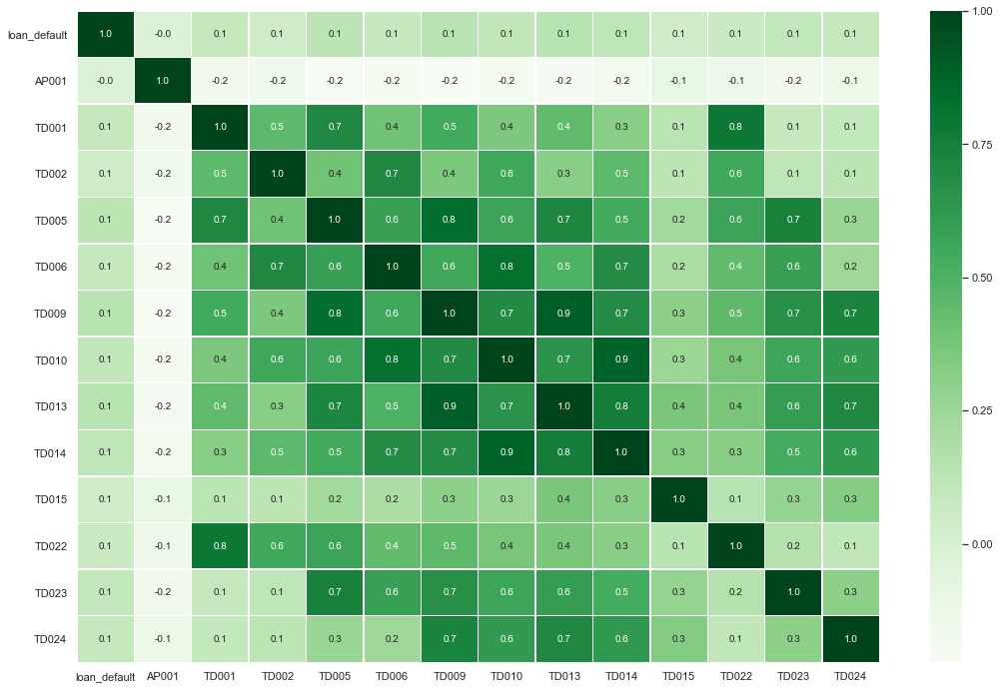

In [25]:
corr = df[['loan_default', 'AP001', 'TD001', 'TD002', 'TD005', 'TD006', 'TD009', 'TD010', 'TD013', 'TD014', 'TD015', 'TD022', 'TD023', 'TD024']].corr()
f,ax = plt.subplots(figsize=(18,12))
sns.heatmap(corr, annot=True, cmap='Greens', linewidths=.4, fmt= '.1f',ax=ax)
plt.show()

In [26]:
# Remove 1 feeature from a pair which has over 0.7 ratio
# I will not remove variable here, as I am  selecting the important variables based on previous RF and GBM models.

corr_var_drop1 = ['TD005', 'TD022', 'TD006', 'TD009', 'TD013', 'TD023', 'TD010', 'TD014']

In [27]:
# df = df.drop(columns = corr_var_drop1) 

#### Check the correlations for the counts, lengths, and days columns
I will be using the other variables as they are all `Call detail` data. 

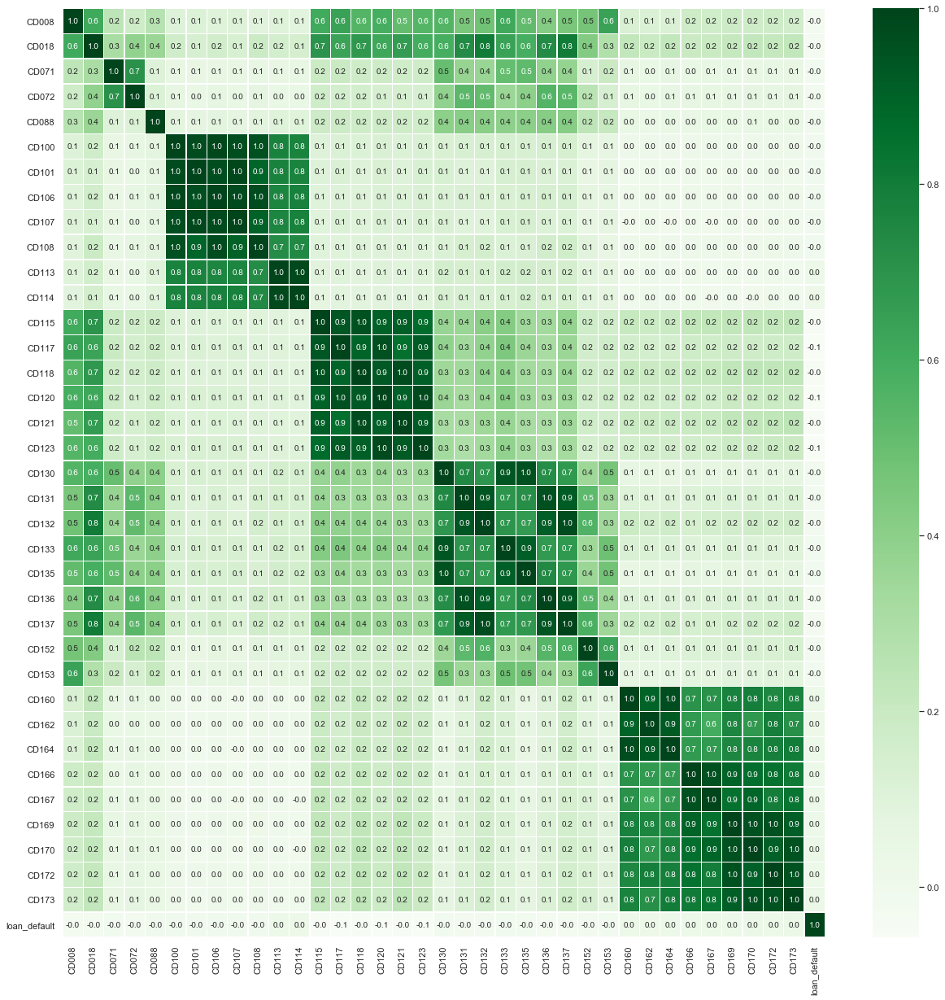

In [28]:
filter_col = [col for col in df if col.startswith('CD')]
filter_col.append('loan_default')
corr = df[filter_col].corr()
f,ax = plt.subplots(figsize=(21,21))
sns.heatmap(corr, annot=True, cmap='Greens', linewidths=.4, fmt= '.1f',ax=ax)
plt.show()

In [29]:
# Remove 1 feature from a pair which has over 0.7 ratio
# I will not remove variable here, as I am  selecting the important variables based on previous RF and GBM models.

corr_var_drop2 = ['CD173', 'CD172', 'CD170', 'CD169', 'CD167', 'CD166', 'CD164', 'CD162',
                 'CD137', 'CD136', 'CD135', 'CD133', 'CD132', 'CD131', 'CD117', 'CD118',
                 'CD120', 'CD121', 'CD123', 'CD114', 'CD113', 'CD108', 'CD107', 'CD106',
                 'CD101', 'CD072']

In [30]:
# df = df.drop(columns = corr_var_drop2) 

## 3.2. Create categorical variables using qcut, and assign function to bin all continuous variables <a class="anchor" id="Section_32"></a>
### These are for the raw data, not the NA imputed one.

* You may need to split a continuous variable into a categorial variable
* Notice how the NoData category is added for "NA".

In [31]:
df_bin = df.copy(deep = True)
df_bin.head(2)

,loan_default,AP001,AP002,AP003,AP004,AP006,AP007,AP008,AP009,TD001,...,CD169,CD170,CD172,CD173,MB005,MB007,Loan_app_day_name,Loan_app_month,Loan_app_time,Loan_app_day
0,1,31,2,1,12,ios,3,3,1,1,...,1449.0,1449.0,2249.0,2249.0,7.0,IPHONE7,Thursday,July,10:21:00,6
1,0,27,1,1,12,h5,5,4,0,2,...,NaN,NaN,NaN,NaN,NaN,WEB,Thursday,April,12:51:00,6


In [32]:
# Write a function and loop through 
def binning(var):
    df_bin[var + '_bin'] = pd.qcut(df_bin[var],15,duplicates='drop').values.add_categories("NoData")
    df_bin[var + '_bin'] = df_bin[var + '_bin'].fillna("NoData").astype(str)
    df_bin[var + '_bin'].value_counts(dropna=False)

In [33]:
features = ['AP001', # 'AP002', 'AP003', 'AP004', 'AP006', 'AP007',
       # 'AP008', 'AP009',
       'TD001', 'TD002', 'TD005', 'TD006', 'TD009', 'TD010',
       'TD013', 'TD014', 'TD015', 'TD022', 'TD023', 'TD024', 'CR004', 'CR005',
       #'CR009', 'CR015', 
       'CR017', 'CR018', 'CR019', 'PA022', 'PA023', 'PA028',
       'PA029', 'PA030', 'PA031', 'CD008', 'CD018', 'CD071', 'CD072', 'CD088',
       'CD100', 'CD101', 'CD106', 'CD107', 'CD108', 'CD113', 'CD114', 'CD115',
       'CD117', 'CD118', 'CD120', 'CD121', 'CD123', 'CD130', 'CD131', 'CD132',
       'CD133', 'CD135', 'CD136', 'CD137', 'CD152', 'CD153', 'CD160', 'CD162',
       'CD164', 'CD166', 'CD167', 'CD169', 'CD170', 'CD172', 'CD173', 'MB005'
       # 'MB007', 'Loan_app_day_name', 'Loan_app_month', 'Loan_app_time',
       # 'Loan_app_day'
           ]

# categorical variables are commented out

In [34]:
for i in features:
    binning(i)

In [35]:
# View the bins of some variables 

print(df_bin['TD001_bin'].value_counts(dropna=False))
print(df_bin['TD022_bin'].value_counts(dropna=False))

(-0.001, 1.0]    33040
(1.0, 2.0]       22199
(2.0, 3.0]       12186
(3.0, 4.0]        6152
(5.0, 20.0]       3510
(4.0, 5.0]        2913
Name: TD001_bin, dtype: int64
(9.999, 15.0]    36564
NoData           19598
(15.0, 20.0]      9462
(25.0, 30.0]      8420
(20.0, 25.0]      5956
Name: TD022_bin, dtype: int64


## 3.3. Distributions of the numerical data, and the `% Y by X` which is the `mean` column for all the numerical columns here <a class="anchor" id="Section_33"></a>
#### This will help identify if mean or median is a better imputation for NA's and also help bin better manually.
#### Also, this will help in feature selection moving forward.

The 'mean' column represents the '% Y by X'.

In [36]:
def plot_X_and_Y(var):
    
    z = df_bin.groupby(var + '_bin')['loan_default'].agg(['count','mean']).reset_index() 
    z['count_pcnt'] = z['count']/z['count'].sum()
    x = z[var + '_bin']
    y_mean = z['mean']
    count_pcnt = z['count_pcnt']
    ind = np.arange(0, len(x))
    width = .5

    fig = plt.figure(figsize=(16,4))
    plt.subplot(121)
    plt.bar(ind, count_pcnt, width, color='r')
    #plt.ylabel('X')
    plt.title(var + ' Distribution')
    plt.xticks(ind,x.tolist(), rotation=45)

    plt.subplot(122)
    plt.bar(ind, y_mean, width, color='b')
    #plt.ylabel('Y by X')
    plt.xticks(ind,x.tolist(), rotation=45)
    plt.tight_layout()
    plt.title('Response mean by ' + var)
    plt.show()
    
#for i in features:
#    plot_X_and_Y(i)  
    

## 3.4. Distributions of the categorical data, and the `% Y by X` which is the `mean` column for all the Categorical columns here <a class="anchor" id="Section_34"></a>
#### This will help identify if mean or median is a better imputation for NA's and also help bin better manually.
#### Also, this will help in feature selection moving forward.

The 'mean' column represents the '% Y by X'.

In [37]:
features_2 = ['AP002', 'AP003', 'AP004', 'AP006', 'AP007', 'AP008', 'AP009',
       'CR009','CR015', 'MB007', 'Loan_app_day_name', 'Loan_app_month',
       'Loan_app_day'
           ]

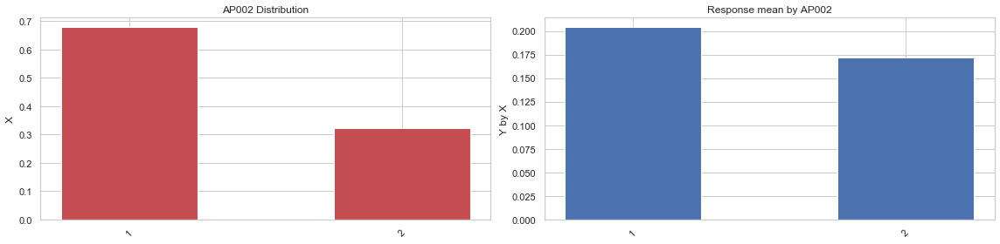

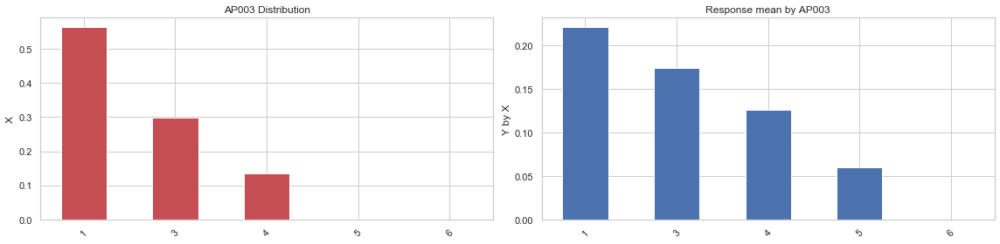

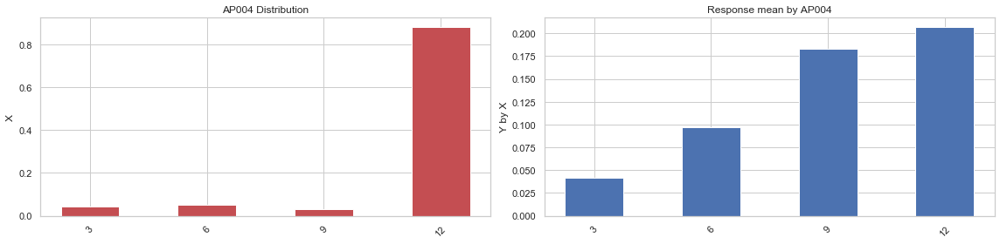

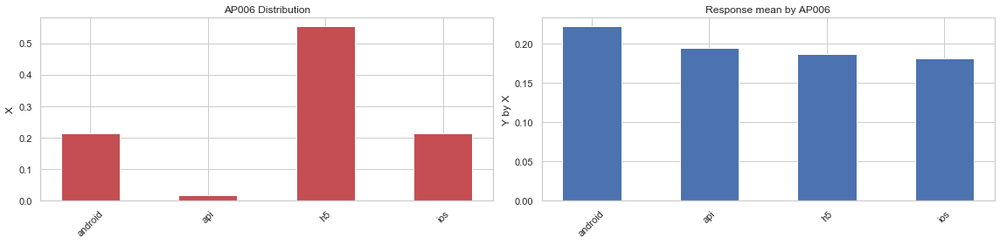

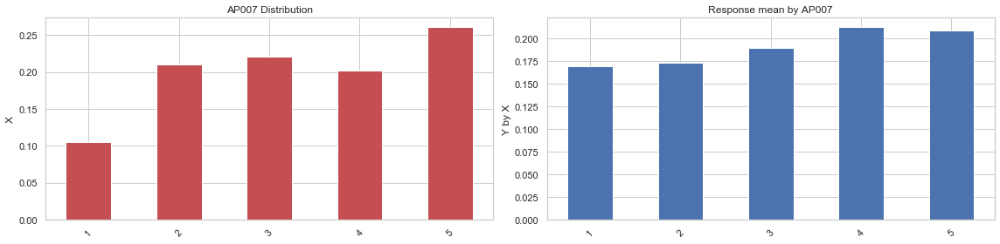

...

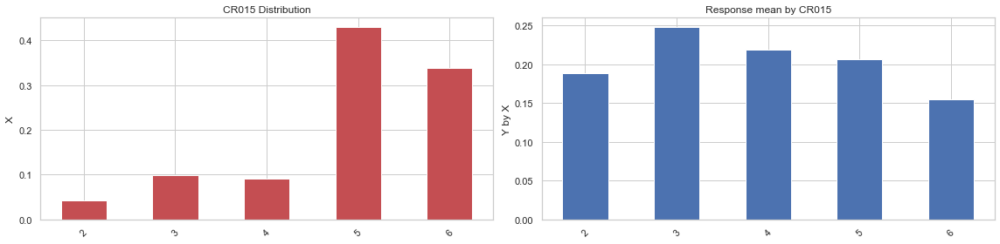

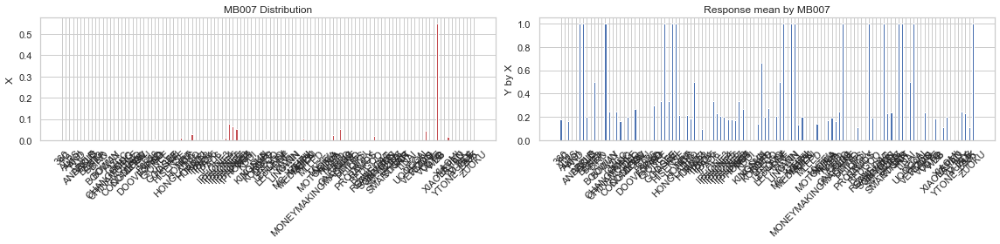

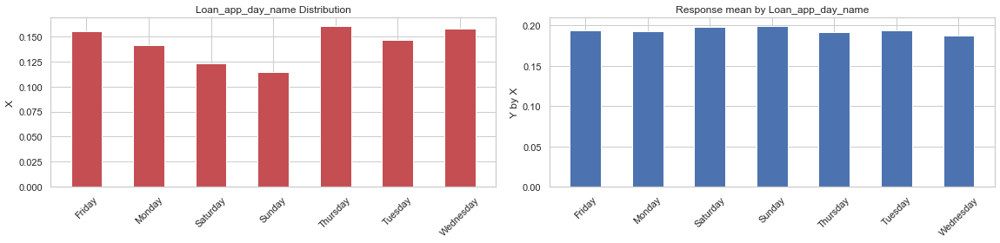

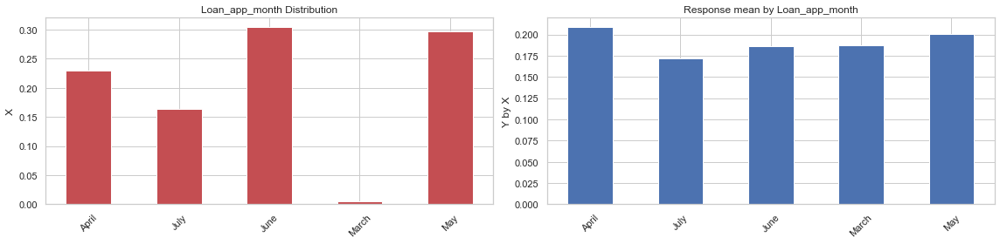

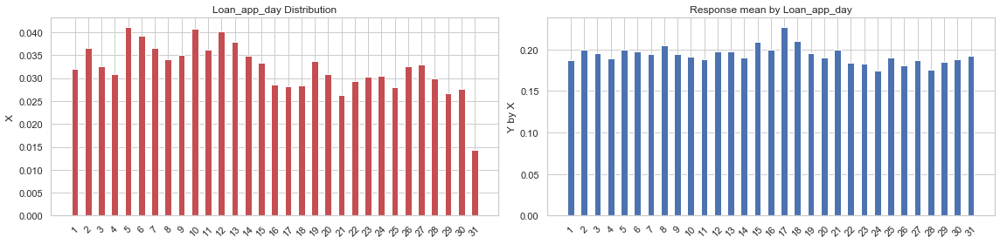

In [38]:
def plot_X_and_Y_cat(var):
    
    z = df_bin.groupby(var)['loan_default'].agg(['count','mean']).reset_index() 
    z['count_pcnt'] = z['count']/z['count'].sum()
    x = z[var]
    y_mean = z['mean']
    count_pcnt = z['count_pcnt']
    ind = np.arange(0, len(x))
    width = .5

    fig = plt.figure(figsize=(16,4))
    plt.subplot(121)
    plt.bar(ind, count_pcnt, width, color='r')
    plt.ylabel('X')
    plt.title(var + ' Distribution')
    plt.xticks(ind,x.tolist(), rotation=45)

    plt.subplot(122)
    plt.bar(ind, y_mean, width, color='b')
    plt.ylabel('Y by X')
    plt.xticks(ind,x.tolist(), rotation=45)
    plt.tight_layout()
    plt.title('Response mean by ' + var)
    plt.show()


for i in features_2:
    plot_X_and_Y_cat(i)  

### Obervations:

From the above graphs, the following variables seem to be not important, as they do not have a pattern or a trend, or a  curve on the '% Y by x' graph: 
1. `Loan_app_day_name`

### Other EDA

## 3.5. Showing the Distribution of X <a class="anchor" id="Section_35"></a>

In [39]:
df_count = df['AP006'].value_counts()
df_count = pd.DataFrame(df_count).reset_index()
df_count.columns = ['AP006 - OS Type','Count']
print(df_count.head())

fig = px.bar(df_count, x = 'AP006 - OS Type', y = 'Count', color = 'AP006 - OS Type',
             width=600, height=400,
            title = "Distribution of OS type")
fig.show()

  AP006 - OS Type  Count
0              h5  44246
1             ios  17159
2         android  17140
3             api   1455


In [40]:
df_count = df['AP002'].value_counts()
df_count = pd.DataFrame(df_count).reset_index()
df_count.columns = ['AP002 - Gender','Count']
print(df_count.head())

fig = px.bar(df_count, x = 'AP002 - Gender', y = 'Count', color = 'AP002 - Gender',
             width=600, height=400,
            title = "Distribution of Gender")
fig.show()

   AP002 - Gender  Count
0               1  54255
1               2  25745


In [41]:
df_count = df['AP003'].value_counts()
df_count = pd.DataFrame(df_count).reset_index()
df_count.columns = ['AP003 - Education','Count']
print(df_count.head())

fig = px.bar(df_count, x = 'AP003 - Education', y = 'Count', color = 'AP003 - Education',
             width=600, height=400,
            title = "Distribution of Education")
fig.show()

   AP003 - Education  Count
0                  1  45079
1                  3  23829
2                  4  10846
3                  5    232
4                  6     14


In [42]:
fig = px.box(df, x="TD001",width=1000, height=500,
            title = "Distribution of TD001 - TD_CNT_QUERY_LAST_7Day_P2P")
fig.show()

In [43]:
fig = px.box(df, x="MB005",width=1000, height=500,
            title = "Distribution of MB005")
fig.show()

## 3.6. Showing the Distribution of Y by another Categorical Variable X <a class="anchor" id="Section_36"></a>

In [44]:
fig = px.box(df, x="AP007", y="TD001",width=900, height=400,
             color = "AP002",
            title = "The Distribution of Level Application City by TD_CNT_QUERY_LAST_7Day_P2P")
fig.show()

## 3.7. Showing interaction of two or three variables <a class="anchor" id="Section_37"></a>

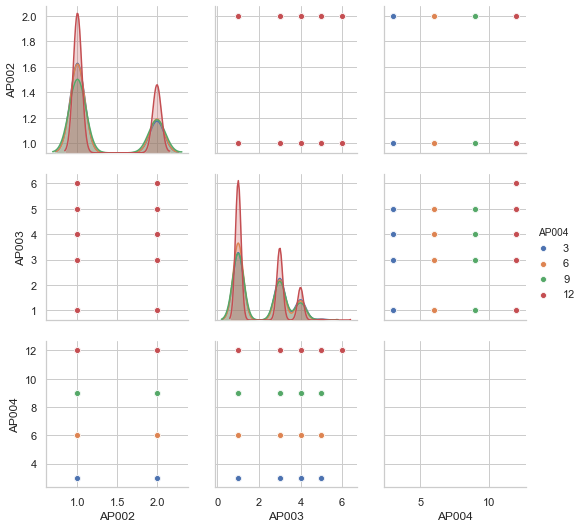

In [45]:
fig = sns.pairplot(df[['AP002', 'AP003', 'AP004']], 
             hue= 'AP004')
fig

.

## ------------------------------------  SECTION BREAK  ------------------------------------

.

# 4. Build the Random Forest Model and find SHAP Values <a class="anchor" id="Section_4"></a>

#### Use the non-binned data, fill NA's with Iterative Imputer Median

### Using the median imputed values from the Iterative Imputer

In [46]:
# Over write the NA value columns, with the previously calculated values
df[features_nan] = imputed_data_median

In [47]:
df.head(2)

,loan_default,AP001,AP002,AP003,AP004,AP006,AP007,AP008,AP009,TD001,...,CD169,CD170,CD172,CD173,MB005,MB007,Loan_app_day_name,Loan_app_month,Loan_app_time,Loan_app_day
0,1,31,2,1,12,ios,3,3,1,1,...,1449,1449,2249,2249,7,IPHONE7,Thursday,July,10:21:00,6
1,0,27,1,1,12,h5,5,4,0,2,...,1086,939,1651,1425,5,WEB,Thursday,April,12:51:00,6


In [48]:
df.isnull().sum().sum()

0

### Selecting the X or the independent variables, as per the Variable Importance found previously in the RF and GMB models. 

### - As per the Random Forest Model of H2O

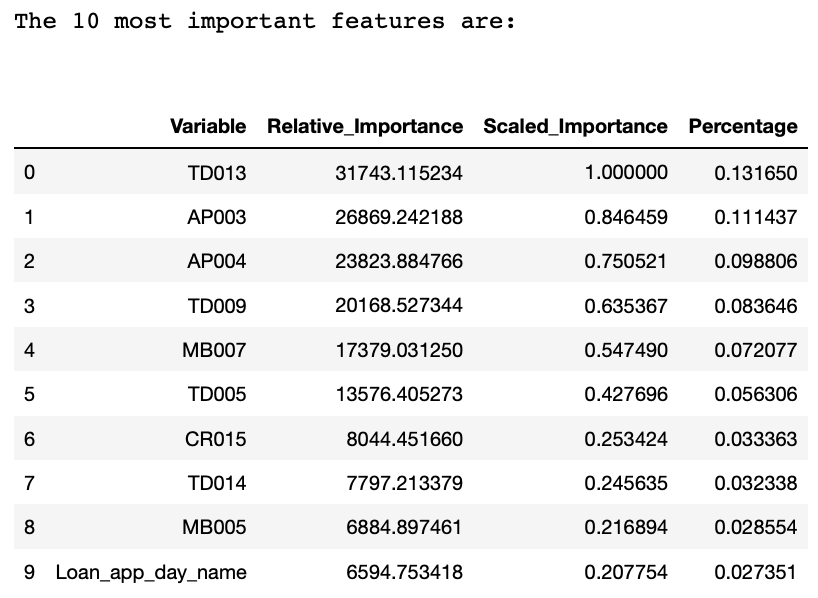


### - As per the GBM Model of H2O

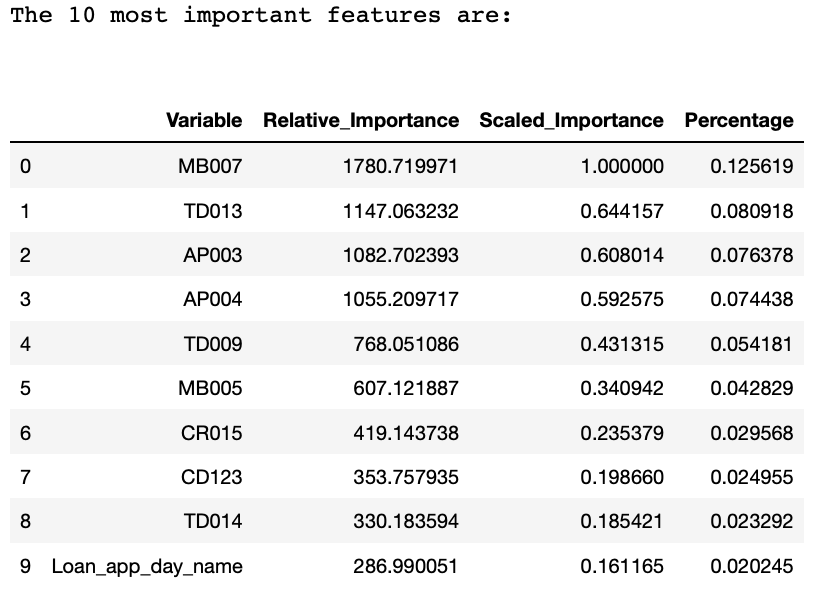

In [49]:
# Selecting the top 10 variables based on above two Variable Importance graphs

vars_selected = ['loan_default',
                 'TD013',
                'AP003',
                'AP004',
                'MB007',
                'TD009',
                'TD005',
                'CR015',
                'TD014',
                'MB005',
                'CD123'
                ]

### Make a final dataset with only the 10 most important variables, & the target variable

In [50]:
df1 = df[vars_selected]
df1.head(2)

,loan_default,TD013,AP003,AP004,MB007,TD009,TD005,CR015,TD014,MB005,CD123
0,1,14,1,12,IPHONE7,5,4,4,2,7,103
1,0,3,1,12,WEB,3,3,6,2,5,106


### Dummy Code all categorical variables

In [51]:
df1 = pd.get_dummies(df1, 
                    drop_first = True)

# Drop the first level, to avoid multi-collinearity

In [52]:
df1.head(2)

,loan_default,TD013,TD009,TD005,TD014,MB005,CD123,AP003_3,AP003_4,AP003_5,...,MB007_YTONE_L985,MB007_YU-FLY,MB007_YUFLY,MB007_ZTE,MB007_ZUK,MB007_ZUOKU,CR015_3,CR015_4,CR015_5,CR015_6
0,1,14,5,4,2,7,103,0,0,0,...,0,0,0,0,0,0,0,1,0,0
1,0,3,3,3,2,5,106,0,0,0,...,0,0,0,0,0,0,0,0,0,1


In [53]:
df1.shape

(80000, 129)

## 4.1. RF Model using sklearn <a class="anchor" id="Section_41"></a>

### Make a list of all of the columns, as per the new dummy set, except the target variable

In [54]:
X_var_list = df1.columns.to_list()
X_var_list = X_var_list[1:]
# X_var_list

### Define the target(Y) and the X variables

In [55]:
Y = df1['loan_default']
X = df1[X_var_list]

### Split to train and test

In [56]:
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size = 0.25)

### Run the Random Forest Model

In [57]:
model = RandomForestRegressor(
    max_depth = 6,
    random_state = 0,
    n_estimators=10)

model.fit(X_train, Y_train)  
print(model.feature_importances_[:10])

[0.3112902  0.06988924 0.03346022 0.02260913 0.05403618 0.05001824
 0.09213176 0.08929653 0.         0.        ]


### Visualize the feature importances

In [58]:
importances = model.feature_importances_
indices = np.argsort(importances)

features = X_train.columns

In [59]:
var_imp_chart = pd.DataFrame()
var_imp_chart['Indices'] = indices
var_imp_chart['Variable'] = features
var_imp_chart['Importance'] = importances
var_imp_chart = var_imp_chart.sort_values(by = 'Importance', axis = 0, ascending = False)

print("The top 10 most important variables are: " + '\n')
var_imp_chart.head(10)

The top 10 most important variables are: 



,Indices,Variable,Importance
0,63,TD013,0.311290
12,71,AP004_12,0.152499
6,80,AP003_3,0.092132
7,79,AP003_4,0.089297
1,89,TD009,0.069889
4,82,MB005,0.054036
5,81,CD123,0.050018
127,0,CR015_6,0.042696
2,88,TD005,0.033460
11,72,AP004_9,0.026727


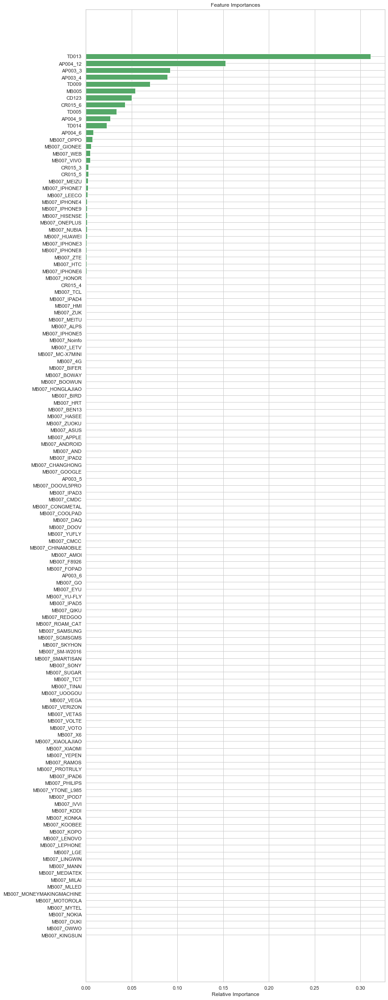

In [60]:
importances = model.feature_importances_
indices = np.argsort(importances)

features = X_train.columns

f, ax = plt.subplots(figsize=(12,40))
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='g', align='center')
plt.yticks(range(len(indices)), [features[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

## 4.2. SHAP Values and SHAP Visualizations <a class="anchor" id="Section_42"></a>

In [61]:
import shap

In [62]:
shap_values = shap.TreeExplainer(model).shap_values(X_train)

In [63]:
# Determine the correlation in order to plot with different colors

corrlist = np.zeros(len(features))
X_train_np = X_train.to_numpy() # our X_train is a pandas data frame. Convert it to numpy

for i in range(0,len(features)):
    tmp = np.corrcoef(shap_values[:,i],X_train_np[:,i])
    corrlist[i] = tmp[0][1]

In [64]:
# plot it
#shap_v_abs = np.abs(shap_values) # Get the absolute values of all SHAP values
#k = pd.DataFrame(shap_v_abs.mean()).reset_index()
#k.columns = ['Variables','abs_SHAP']
#k2 = k.merge()

## 4.2.1. Global Interpretability <a class="anchor" id="Section_421"></a>
## SHAP Variable Importance Plot

The shap.summary_plot function with plot_type = ”bar” lets us produce the variable importance plot. 

A variable importance plot lists the most significant variables in descending order. The top variables contribute more to the model than the bottom ones and thus have high predictive power.

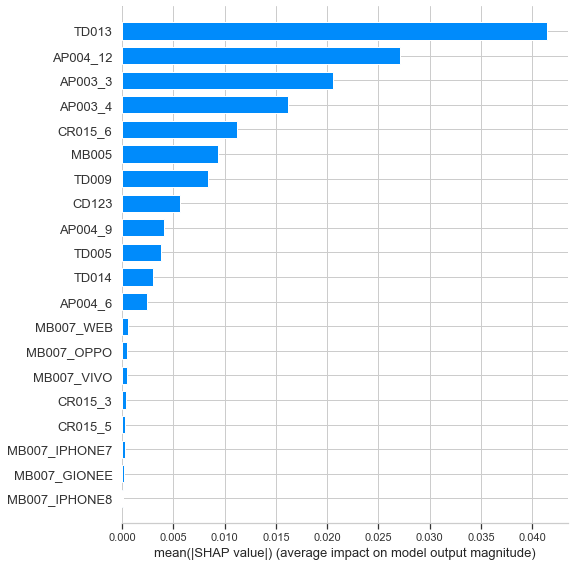

In [65]:
shap.summary_plot(shap_values, X_train, plot_type = "bar")

In [66]:
df.CR015.value_counts()

5    34339
6    27127
3     7861
4     7297
2     3376
Name: CR015, dtype: int64

#### Observation: 

The SHAP Value Variable Importance plot need not be the  same as the RF Model Variable Importance plot. For our analysis, we will only consider the SHAP Value plot, as it is more valuable and credible. 

As we see, the most important variable is `TD013 (Count of Queries in Last 6 Months)`, followed by the level 12 of AP004 (Loan Term), which is the `12 years of Loan term`.

## 4.2.2. SHAP Summary Plot <a class="anchor" id="Section_422"></a>

The SHAP value summary plot can further show the positive and negative relationships of the predictors with the target variable, and their influence on the predictions.

#### About the Summary Plot -

- `Y axis`: The Left side, or the Y axis shows the different variables, sorted as per the variable significance, from top to bottom
- `Color`: Red means a high value of that variable, and Blue means a low value of that variable
- `X axis`: This is the SHAP value, which measures the contribution of that partocular variable to the target, which is prediction of the loan default. 
- `Points/Dots`: Each dot represents each (one) observation in the data (X Train)

#### A positive, or a high SHAP value means that the variable has a strong, positive impact to the target.

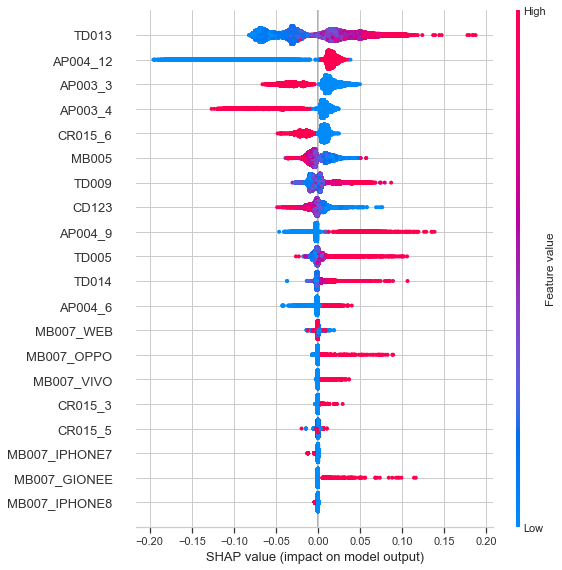

In [67]:
shap.summary_plot(shap_values, X_train)

### Business Insights of Top 5 variables:

1. `TD013` - This variable, or the `Count of Queries in Last 6 months`, has a positive relation with the loan default, in a way that, if this value is high (more red), it is likely that the  value of loan default will be high. This means that a high count of queries in last 6  months is likely to be a loan default. 

2. `AP004_12` - This Variable, or the `Loan Term of 12 years` (has 4 levels - 3, 6, 9, and 12 years), has a positive relation to the loan default, in a  way that, if the if this value is high (more red), it is likely that the  value of loan default will be high. This means that a loan term of 12 years is likely to be a loan default.

3. `AP003_3` - This variable, or the `Education Code Level 3` (has 5 levels - 1, 3, 4, 5, 6), has a negative relation with the loan default, in a way that, if this value is high (more red), it is very less likely that the value of loan default will be high. This means that a higher education code or level 3 education is less likely to be a loan default. 

4. `AP003_4` - This variable, or the `Education Code Level 4` (has 5 levels - 1, 3, 4, 5, 6), has a negative relation with the loan default, in a way that, if this value is high (more red), it is very less likely that the value of loan default will be high. This means that a higher education code or level 3 education is less likely to be a loan default. 

5. `CR015_6` - This variable, or the `Months of Credit Card MOB Max Level 6` (has 5 levels - 2, 3, 4, 5, 6), has a negative relation with the loan default, in a way that, if this value is high (more red), it is very less likely that the value of loan default will be high. This means that a more months of credit  card max or level 6  is less likely to be a loan default. 

#### Before giving out a loan, or rejecting a loan, the above mentioned explanations will be very handy.

Similarly, we can interpret the other variables. 

#### Finally, we can describe the model. A `high chance of loan default` is associated with the following characteristics, as per the above given explanations:
* High TD013 
* High AP004_12 
* Low AP003_3 
* Low AP003_4 
* Low CR015_6 
* Low MB005
* Low CD123
* High TD009
* High TD005
* High AP004_9
* High TD014
* High AP004_6

### Show a simple summary plot, with only the positive vs the negative impacts of the  variables.

The red color  means a positive impact, and  the  blue means a negative impact.

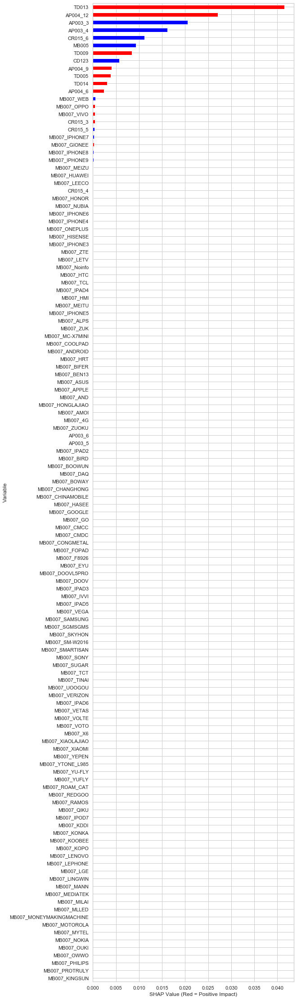

In [68]:
def ABS_SHAP(df_shap,df):
    #import matplotlib as plt
    # Make a copy of the input data
    shap_v = pd.DataFrame(df_shap)
    feature_list = df.columns
    shap_v.columns = feature_list
    df_v = df.copy().reset_index().drop('index',axis=1)
    
    # Determine the correlation in order to plot with different colors
    corr_list = list()
    for i in feature_list:
        b = np.corrcoef(shap_v[i],df_v[i])[1][0]
        corr_list.append(b)
    corr_df = pd.concat([pd.Series(feature_list),pd.Series(corr_list)],axis=1).fillna(0)
    # Make a data frame. Column 1 is the feature, and Column 2 is the correlation coefficient
    corr_df.columns  = ['Variable','Corr']
    corr_df['Sign'] = np.where(corr_df['Corr']>0,'red','blue')
    
    # Plot it
    shap_abs = np.abs(shap_v)
    k=pd.DataFrame(shap_abs.mean()).reset_index()
    k.columns = ['Variable','SHAP_abs']
    k2 = k.merge(corr_df,left_on = 'Variable',right_on='Variable',how='inner')
    k2 = k2.sort_values(by='SHAP_abs',ascending = True)
    colorlist = k2['Sign']
    ax = k2.plot.barh(x='Variable',y='SHAP_abs',color = colorlist, figsize=(8,40),legend=False)
    ax.set_xlabel("SHAP Value (Red = Positive Impact)")
    
ABS_SHAP(shap_values,X_train)  

## 4.2.3. SHAP Variable Dependence Plot <a class="anchor" id="Section_423"></a>

To understand how a single feature effects the output of the model we can plot the SHAP value of that feature vs. the value of the feature for all the examples in a dataset. Since SHAP values represent a feature's responsibility for a change in the model output, the plot(s) below represents the change in predicted loan default as the partocular variable changes. 

To help reveal the interactions, dependence_plot automatically selects another feature for coloring. 
The SHAP plot function automatically includes another variable that our chosen variable interacts most with. 

We may ask how to show a partial dependence plot. The partial dependence plot shows the marginal effect one or two features have on the predicted outcome of a machine learning model (J. H. Friedman 2001). It tells whether the relationship between the target and a feature is linear, monotonic or more complex.

In the dependence plots -
- `Left Y axis` - The SHAP Value or the impact of the variable on the target 
- `Right Y axis` - The variable which highly correlated wiht the main predictor variable. It gives the variable which interacts most with the main variable being studied. 
- `X axis` - The variable itself, the actual values 
- `Color` - The value of the second variable, high or low. Red is the high value, Blue is low value


#### Below, I will show the variable dependence plots for 5 important variables:



### Dependence Plot for `TD013` - Count of Queries in Past 6 Months

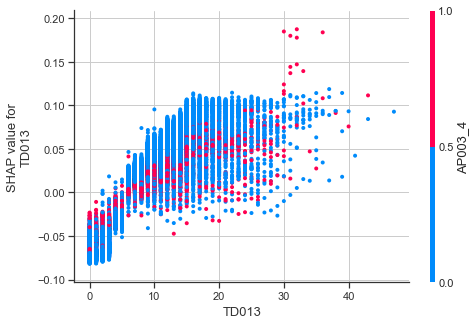

In [69]:
shap.dependence_plot("TD013", shap_values, X_train)

### Business Insights:

In this case, we see that:
- As `TD013` or the count of queries in last 6 months increases, the value impact on loan default increases, making it more likely to be a default. There is a positive relation between the variable and the loan default value. 
- If the value of `AP003_4` or the Education Code Level 4 is low (more blue), it leads to a increase in the value of the loan default, making it likely to be a default. 
- Looking  at the majority of the points, it can be said that `both the variables` have a different impacts on the loan default value, and if both have high and low values respectively, it is very likely that it will be a loan default. There are more blue dots (low value of AP003_4, in the area where TD013 is high.

Although, it is to note that TD013 has a much larger impact on the value of loan default than the AP003_4.

The plot shows there is an approximately linear and positive trend between “TD013” and the target variable loan default, and “TD013” interacts with “AP003_4” frequently.

A `high chance of loan default` is associated with a high value for TD013 and low for AP003_4, as per the above given explanations. Hence, giving out of loan should be considered.

#### Final Insight:  A high count of queries in past 6 months, is more likely to result in a loan default and low value of education code level 4 years is also more likely to result in a default.

### Dependence Plot for `AP003_4` - Education Code 4 (out of total 5 levels)

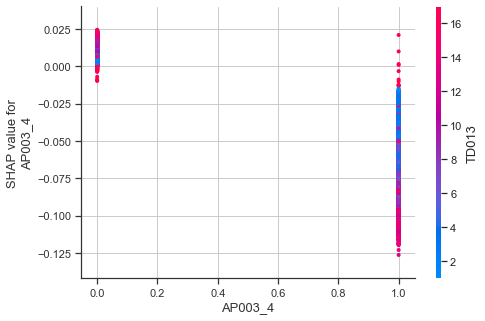

In [70]:
shap.dependence_plot("AP003_4", shap_values, X_train)

### Business Insights:

In this case, we see that:
- The variable being evaluated is `AP003_4` ir the education code, at level 4, which is a binary variable. Hence, the  graphs only shows two values  for the variable, 0 or 1. 
- If the AP003_4 is 1, which means true for education level code 4, the impact on loan default is distributed but lower, making it less likely to be a default. There is a negative relation between the variable and the loan default value. 
- If the value of `TD013` or count of queries in last 6 months is high (more red), the impact on loan default is distributed, but the value of loan default is generally the highest for a high value of TD013, making it likely to be a default. 
- Looking  at the majority of the points, it can be said that `both the variables` have different impacts on the loan default value, and if AP003_4 has low values coupled with high values of TD013, it is very likely that it will be a loan default.

Although, it is to note that TD013 has a much larger impact on the value of loan default than the AP003_4.

The plot shows there is a binary trend, and "AP003_4" interacts with “TD013” at eitherr 0 or 1.

A `high chance of loan default` is associated with a high value for TD013 and low value of AP003_4, as per the above given explanations. Hence, giving out of loan should be considered.

#### Final Insight:  A higher education, such as code 4, is less likely to result in a loan default.

### Dependence Plot for `MB005` - Years phone is active

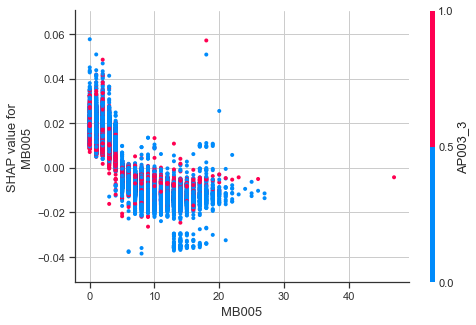

In [71]:
shap.dependence_plot("MB005", shap_values, X_train)

### Business Insights:

In this case, we see that:
- As `MB005` or the number of years the phone is active increases, the value impact on loan default decreases, making it less likely to be a default. There is a negative relation between the variable and the loan default value. 
- If the value of `AP003_3` or the education code level  3 is high (more red), it still has no direct relation to the value of the loan default, however, towards the region where the loan default value is high, there are many blue dots, making it less likely to be a default predictor. 
- Looking  at the majority of the points, it can be said that `both the variables` have different impacts on the loan default value, and if AP003_3 has low values coupled with low values of MB005, it is very likely that it will be a loan default.

Although, it is to note that AP003_3 or loan term has a much larger impact on the value of loan default than the MB005 or years of phone active.

The plot shows there is an approximately downward linear trend between “MB005” and the target variable loan default, and “MB005” interacts with “AP003_3” frequently.

A `high chance of loan default` is associated with a low value for MB005 and a low value for AP003_3, as per the above given explanations. Hence, giving out of loan should be considered.

#### Final Insight:  A low number of years of phone active, is more likely to result in a loan default.

### Dependence Plot for `CD123` - Count of Distinct Outbound Calls in past 3 months

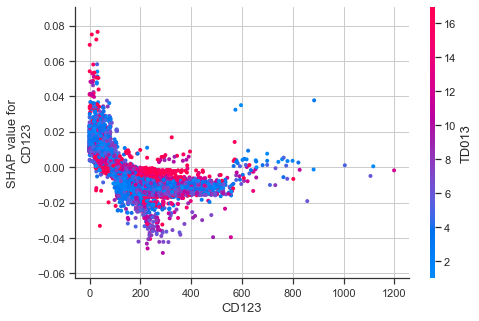

In [72]:
shap.dependence_plot("CD123", shap_values, X_train)

### Business Insights:

In this case, we see that:
- As `CD123` or the count of distinct outbound calls in past 3 months increases, the value impact on loan default decreases, making it less likely to be a default. There is a negative relation between the variable and the loan default value. However, after a certain  points, the relation stabilizes.
- If the value of `TD013` or count of queries in past 6 months is high (more red), it leads to a increase in the value of the loan default, making it likely to be a default.  
- Looking  at the majority of the points, it can be said that `both the variables` have a different impact on the loan default value, and if CD123 has low values coupled with high values of TD013, it is very likely that it will be a loan default.

Although, it is to note that TD013 or counnt of queries has a much larger impact on the value of loan default than the CD123.

The plot shows there is a mixed or hybrid trend between “CD123” and the target variable loan default, and “CD123” interacts with “TD013” frequently.

A `high chance of loan default` is associated with a low value for CD123 and a high value for TD013, as per the above given explanations. Hence, giving out of loan should be considered.

#### Final Insight:  A low count of distinct outbound calls in past 3 months, is more likely to result in a loan default.

### Dependence Plot for `TD009` - Count of queries in the past 3 months

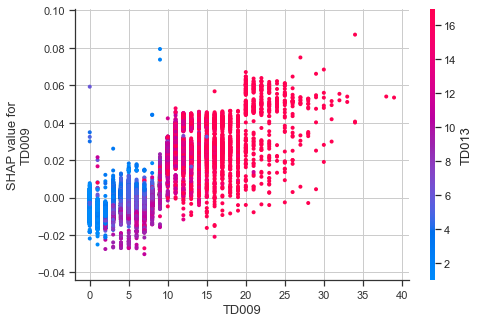

In [73]:
shap.dependence_plot("TD009", shap_values, X_train)

### Business Insights:

In this case, we see that:
- As `TD009` or the count of queries in last 3 months increases, the value impact on loan default increases, making it more likely to be a default. There is a positive relation between the variable and the loan default value. 
- If the value of `TD013` or the count of queries in last 6 months is high (more red), it leads to a increase in the value of the loan default, making it likely to be a default. 
- Looking  at the majority of the points, it can be said that `both the variables` have a positive impact on the loan default value, and if both have high values, it is very likely that it will be a loan default. There are more red dots (high value of TD013, in the area where TD009 is high.

Although, it is to note that TD013 has a much larger impact on the value of loan default than the TD009.

The plot shows there is an approximately linear and positive trend between “TD009” and the target variable loan default, and “TD009” interacts with “TD013” frequently.

A `high chance of loan default` is associated with a high value for TD009 and TD013, as per the above given explanations. Hence, giving out of loan should be considered.

#### Final Insight:  A high count of queries in past 3 months, is more likely to result in a loan default.

### Dependence Plots for Multiple variables, shown together

For the top 6 variables, it shows the other top 6 variables it interacts with, and their impact on the loan default value.

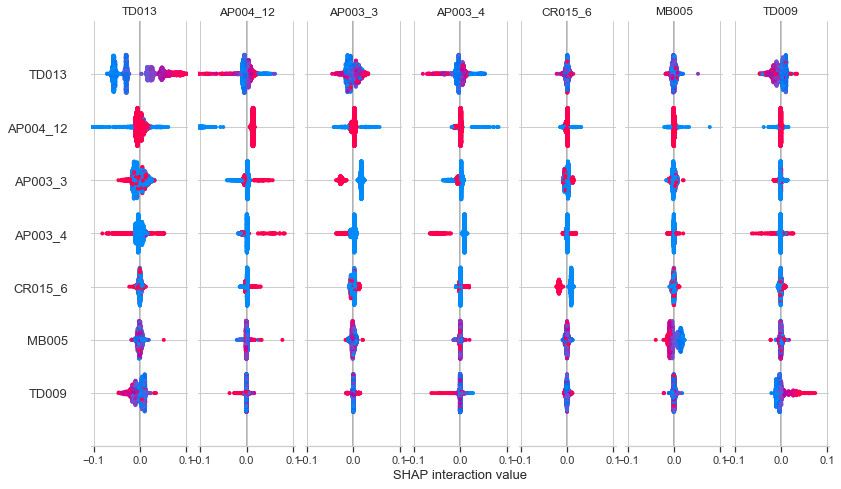

In [74]:
# Here, I am taking only the first 2,000 rows to save run time

shap_interaction_values = shap.TreeExplainer(model).shap_interaction_values(X_train.iloc[:2000,:])
shap.summary_plot(shap_interaction_values, X_train.iloc[:2000,:])

## 4.2.4. Local Interpretability <a class="anchor" id="Section_424"></a>
## Individual SHAP Value Plot (Force Plots)

The force plots help explain the predicted value  for each observation.

In order to show how the SHAP values can be done on individual cases, I will execute on several random observations. I randomly chose a few observations in as shown below:

In [75]:
X_output = X_test.copy()
X_output.loc[:,'predict'] = np.round(model.predict(X_output),2)

random_picks = np.arange(1,4000,500)
S = X_output.iloc[random_picks]
S

,TD013,TD009,TD005,TD014,MB005,CD123,AP003_3,AP003_4,AP003_5,AP003_6,...,MB007_YU-FLY,MB007_YUFLY,MB007_ZTE,MB007_ZUK,MB007_ZUOKU,CR015_3,CR015_4,CR015_5,CR015_6,predict
15378,2,2,1,2,11,32,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0.11
52399,10,5,2,2,9,274,1,0,0,0,...,0,0,0,0,0,0,0,1,0,0.19
33086,2,2,2,0,8,61,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0.12
17694,3,3,2,1,6,53,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0.19
49315,7,7,4,4,4,143,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0.30
54591,1,1,1,2,12,111,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0.09
74680,7,4,3,2,5,131,1,0,0,0,...,0,0,0,0,0,0,0,1,0,0.19
36874,10,9,5,2,5,105,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0.31


In [76]:
# Initialize the jupyter notebook 
shap.initjs()

### Calculate Inidivual SHAP Values

I write a small function shap_plot(j) to execute the SHAP values for the observations.

In the code below, the shap.force_plot() takes three values: 
- the base value (explainerModel.expected_value[0]) 
- the SHAP values (shap_values_Model[j][0]) 
- the matrix of feature values (S.iloc[[j]])

The base value or the expected value is the average of the model output over the training data X_train. It is the base value used in the following plot.

In [77]:
def shap_plot(j):
    explainerModel = shap.TreeExplainer(model)
    shap_values_Model = explainerModel.shap_values(S)
    p = shap.force_plot(explainerModel.expected_value, shap_values_Model[j], S.iloc[[j]])
    return(p)

### Print  the mean of the important variables, to explian the force plots

In [145]:
means = pd.DataFrame(X_train.mean()).reset_index()
means.columns = ['Variable', 'Mean']

print(means[means['Variable'] == 'TD013'])
print()
print(means[means['Variable'] == 'CR015_6'])
print()
print(means[means['Variable'] == 'MB005'])
print()
print(means[means['Variable'] == 'TD005'])
print()
print(means[means['Variable'] == 'TD009'])
print()
print(means[means['Variable'] == 'AP004_12'])
print()
print(means[means['Variable'] == 'AP003_3'])
print()
print(means[means['Variable'] == 'AP003_4'])
print()
print(means[means['Variable'] == 'CR015_3'])
print()
print(means[means['Variable'] == 'CD123'])

  Variable      Mean
0    TD013  6.817367

    Variable      Mean
127  CR015_6  0.340067

  Variable      Mean
4    MB005  5.974067

  Variable      Mean
2    TD005  3.602433

  Variable      Mean
1    TD009  5.411317

    Variable    Mean
12  AP004_12  0.8789

  Variable      Mean
6  AP003_3  0.297783

  Variable      Mean
7  AP003_4  0.137033

    Variable     Mean
124  CR015_3  0.09895

  Variable        Mean
5    CD123  121.597333


In [146]:
# Mean or the base value of Y

round(Y_test.mean(), 2)

0.19

### Individual SHAP Plot (Force Plot) 1

In [147]:
shap_plot(0)

### Business Insights: 

* Output value: This is the prediction for that observation, which here is 0.15, lower than the mean

* Base value: The base value E (y_hat) is "the value that would be predicted if we did not know any features for the current output." In other words, it is the mean prediction, or mean (y_hat). So the mean prediction of Y_test is 0.19.

* Features: The above plot shows features that contributes to push the final prediction away from the base value.

* Red/blue colors: Those features that push the prediction higher (to the right) are shown in red, and those pushing the prediction lower are in blue. 


#### Features Explanation:

Negative (Blue)

* `TD013`: It has a negative impact on the loan default value. The TD013 or the Count of Queries in the past 6 months observation is 2 which is lower than the average value 6.81. So it pushes the prediction to the left, away from the base value or mean value. As we saw in the summary plot, a high value of this variable results in a  likely loan default, hence here, since this value is low, it pushes towards a less likely loan default, to the left. 

* `CR015_6`: It has a negative impact on the loan default value. The CR015_6 or the Months of Credit Card MOB Max Level 6, has a value of 1 here, which is higher than its average of 0.34, it pushes the predicted loan default value to the left. As we saw in the summary plot, a high value of this variable results in a less likely loan default, hence here, since this value is high, it pushes towards a less likely loan default, to the left.

* `MB005`: It has a negative impact on the loan default value. The MB005 or the Years Phone is active, has a value of 11 here, which is higher than its average of 5.97, it pushes the predicted loan default value to the left. As we saw in the summary plot, a high value of this variable results in a less likely loan default, hence here, since this value is high, it pushes towards a less likely loan default, to the left.

Positive (Red)

* `CD123`: It has a positive impact on the loan default value. The CD123 or Count of Distinct Outbound call in past 3 months, has a value of 32 here, which is lower than its average of 121.59, it pushes the predicted loan default value to the right. As we saw in the summary plot, a low value of this variable results in a more likely loan default, hence here, since this value is low, it pushes towards a more likely loan default, to the right.

### Individual SHAP Plot (Force Plot) 2

In [148]:
shap_plot(1)

### Business Insights: 

* Output value: This is the prediction for that observation, which here is 0.23, higher than the mean

* Base value: The base value E (y_hat) is "the value that would be predicted if we did not know any features for the current output." In other words, it is the mean prediction, or mean (y_hat). So the mean prediction of Y_test is 0.19.

* Features: The above plot shows features that contributes to push the final prediction away from the base value.

* Red/blue colors: Those features that push the prediction higher (to the right) are shown in red, and those pushing the prediction lower are in blue. 


#### Features Explanation:

Negative (Blue)

* `AP003_3`: It has a negative impact on the loan default value. The AP003_3 or Education Code Level 3, has a value of 1 here, which is higher than its average of 0.29, it pushes the predicted loan default value to the left. As we saw in the summary plot, a high value of this variable results in a less likely loan default, hence here, since this value is high, it pushes towards a less likely loan default, to the left.

* `CD123`: It has a negative impact on the loan default value. The CD123 or Count of Distinct Outbound call in past 3 months, has a value of 274 here, which is higher than its average of 121.59, it pushes the predicted loan default value to the left. As we saw in the summary plot, a high value of this variable results in a less likely loan default, hence here, since this value is high, it pushes towards a less likely loan default, to the left.

Positive (Red)

* `TD013`: It has a positive impact on the loan default value. The TD013 or the Count of Queries in the past 6 months observation is 10 which is higher than the average value 6.81. So it pushes the prediction to the right, towards the base value or mean value. As we saw in the summary plot, a high value of this variable results in a more likely loan default, hence here, since this value is high, it pushes towards a more likely loan default, to the right.

* `AP004_12`: It has a positive impact on the loan default value. The AP004_12 or a Loan term of 12 years, has a value of 1 here, which is higher than its average of 0.87, it pushes the predicted loan default value to the right. As we saw in the summary plot, a high value of this variable results in a more likely loan default, hence here, since this value is high, it pushes towards a more likely loan default, to the right.

### Individual SHAP Plot (Force Plot) 3

In [149]:
shap_plot(2)

### Business Insights: 

* Output value: This is the prediction for that observation, which here is 0.15, lower than the mean

* Base value: The base value E (y_hat) is "the value that would be predicted if we did not know any features for the current output." In other words, it is the mean prediction, or mean (y_hat). So the mean prediction of Y_test is 0.19.

* Features: The above plot shows features that contributes to push the final prediction away from the base value.

* Red/blue colors: Those features that push the prediction higher (to the right) are shown in red, and those pushing the prediction lower are in blue. 


#### Features Explanation:

Negative (Blue)

* `TD013`: It has a negative impact on the loan default value. The TD013 or the Count of Queries in the past 6 months observation is 2 which is lower than the average value 6.81. So it pushes the prediction to the left, away from the base value or mean value. As we saw in the summary plot, a low value of this variable results in a less likely loan default, hence here, since this value is low, it pushes towards a less likely loan default, to the left.

* `CR015_6`: It has a negative impact on the loan default value. The CR015_6 or the Months of Credit Card MOB Max Level 6, has a value of 1 here, which is higher than its average of 0.34, it pushes the predicted loan default value to the left. As we saw in the summary plot, a high value of this variable results in a less likely loan default, hence here, since this value is high, it pushes towards a less likely loan default, to the left.

Positive (Red)

* `AP004_12`: It has a positive impact on the loan default value. The AP004_12 or a Loan term of 12 years, has a value of 1 here, which is higher than its average of 0.87, it pushes the predicted loan default value to the right. As we saw in the summary plot, a high value of this variable results in a more likely loan default, hence here, since this value is high, it pushes towards a more likely loan default, to the right.

* `CD123`: It has a positive impact on the loan default value. The CD123 or Count of Distinct Outbound call in past 3 months, has a value of 61 here, which is lower than its average of 121.59, it pushes the predicted loan default value to the right. As we saw in the summary plot, a low value of this variable results in a more likely loan default, hence here, since this value is low, it pushes towards a more likely loan default, to the right.

### Individual SHAP Plot (Force Plot) 4

In [150]:
shap_plot(3)

### Business Insights: 

* Output value: This is the prediction for that observation, which here is 0.18, near to the mean

* Base value: The base value E (y_hat) is "the value that would be predicted if we did not know any features for the current output." In other words, it is the mean prediction, or mean (y_hat). So the mean prediction of Y_test is 0.19.

* Features: The above plot shows features that contributes to push the final prediction away from the base value.

* Red/blue colors: Those features that push the prediction higher (to the right) are shown in red, and those pushing the prediction lower are in blue. 


#### Features Explanation:

Negative (Blue)

* `TD013`: It has a negative impact on the loan default value. The TD013 or the Count of Queries in the past 6 months observation is 3 which is lower than the average value 6.81. So it pushes the prediction to the left. As we saw in the summary plot, a low value of this variable results in a less likely loan default, hence here, since this value is low, it pushes towards a less likely loan default, to the left.

* `MB005`: It has a negative impact on the loan default value. The MB005 or the Years Phone is active, has a value of 6 here, which is higher than its average of 5.97, it pushes the predicted loan default value to the left. As we saw in the summary plot, a high value of this variable results in a less likely loan default, hence here, since this value is high, it pushes towards a less likely loan default, to the left.

Positive (Red)

* `CD123`: It has a positive impact on the loan default value. The CD123 or Count of Distinct Outbound call in past 3 months, has a value of 53 here, which is lower than its average of 121.59, it pushes the predicted loan default value to the right. As we saw in the summary plot, a low value of this variable results in a more likely loan default, hence here, since this value is low, it pushes towards a more likely loan default, to the right.

* `AP004_12`: It has a positive impact on the loan default value. The AP004_12 or a Loan term of 12 years, has a value of 1 here, which is higher than its average of 0.87, it pushes the predicted loan default value to the right. As we saw in the summary plot, a high value of this variable results in a more likely loan default, hence here, since this value is high, it pushes towards a more likely loan default, to the right.

### Individual SHAP Plot (Force Plot) 5

In [151]:
shap_plot(4)

### Business Insights: 

* Output value: This is the prediction for that observation, which here is 0.30, higher than the mean

* Base value: The base value E (y_hat) is "the value that would be predicted if we did not know any features for the current output." In other words, it is the mean prediction, or mean (y_hat). So the mean prediction of Y_test is 0.19.

* Features: The above plot shows features that contributes to push the final prediction away from the base value.

* Red/blue colors: Those features that push the prediction higher (to the right) are shown in red, and those pushing the prediction lower are in blue. 


#### Features Explanation:

Positive (Red)

* `TD013`: It has a positive impact on the loan default value. The TD013 or the Count of Queries in the past 6 months observation is 7 which is higher than the average value 6.81. So it pushes the prediction to the right. As we saw in the summary plot, a high value of this variable results in a more likely loan default, hence here, since this value is high, it pushes towards a more likely loan default, to the right.

* `AP003_3`: It has a positive impact on the loan default value. The AP003_3 or Education Code Level 3, has a value of 0 here, which is lower than its average of 0.29, it pushes the predicted loan default value to the right. As we saw in the summary plot, a low value of this variable results in a more likely loan default, hence here, since this value is low, it pushes towards a more likely loan default, to the right.

* `AP004_12`: It has a positive impact on the loan default value. The AP004_12 or a Loan term of 12 years, has a value of 1 here, which is higher than its average of 0.87, it pushes the predicted loan default value to the right. As we saw in the summary plot, a high value of this variable results in a more likely loan default, hence here, since this value is high, it pushes towards a more likely loan default, to the right.

* `AP003_4`: It has a positive impact on the loan default value. The AP003_4 or Education Code Level 4, has a value of 0 here, which is lower than its average of 0.17, it pushes the predicted loan default value to the right. As we saw in the summary plot, a low value of this variable results in a more likely loan default, hence here, since this value is low, it pushes towards a more likely loan default, to the right.

.

## ------------------------------------  SECTION BREAK  ------------------------------------

.

# 5. Future Considerations, LIME Model, Conclusion <a class="anchor" id="Section_5"></a>

#### There are also other plots, which might give a better explanation of the model. However, all models, do not support all graphs ad  we need to extra careful in using them. 

These are just for illustrative purpose:

https://docs.h2o.ai/h2o/latest-stable/h2o-docs/explain.html

- Heatmap
![Heatmap](https://docs.h2o.ai/h2o/latest-stable/h2o-docs/_images/explain_varimp_heatmap_wine.png)

- Correlation Map
![Correlation](https://docs.h2o.ai/h2o/latest-stable/h2o-docs/_images/explain_model_correlation_heatmap_wine.png)

- Individual Conditional Expectation (ICE)
![ICE Plot](https://docs.h2o.ai/h2o/latest-stable/h2o-docs/_images/explain_ice_plot_wine_alcohol.png)



## LIME Model

LIME (Local Interpretable Model-agnostic Explanations) builds sparse linear models around an individual prediction in its local vicinity. This is documented in Lundberg and Lee (2016) that LIME is actually a subset of SHAP but lacks the same properties.

### The Advantage of LIME over SHAP — SPEED

Readers may ask: “If SHAP is already a united solution, why should we consider LIME?” 

The two methods emerge very differently. The advantage of LIME is speed. LIME perturbs data around an individual prediction to build a model, while SHAP has to compute all permutations globally to get local accuracy. Further, the SHAP Python module does not yet have specifically optimized algorithms for all types of algorithms (such as KNNs), as I have documented in “Explain Any Models with the SHAP Values — Use the KernelExplainer” that test models in KNN, SVM, Random Forest, GBM, or the H2O module.

In [152]:
X_var_list = df1.columns.to_list()
X_var_list = X_var_list[1:]
# X_var_list

Y = df1['loan_default']
X = df1[X_var_list]

X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size = 0.25)

model = RandomForestRegressor(
    max_depth = 6,
    random_state = 0,
    n_estimators=10)

model.fit(X_train, Y_train)

RandomForestRegressor(max_depth=6, n_estimators=10, random_state=0)

In [153]:
import lime
import lime.lime_tabular

X_featurenames = X.columns

explainer = lime.lime_tabular.LimeTabularExplainer(np.array(X_train),
                    feature_names = X_featurenames, 
                    class_names = ['loan_default'], 
                    #categorical_features = ['AP003', 'AP004', 'MB007', 'CR015'], 
                    verbose=True, mode='regression')

### Interpret the first record

Intercept -0.12963368913110435
Prediction_local [0.15365218]
Right: 0.21592283866297013


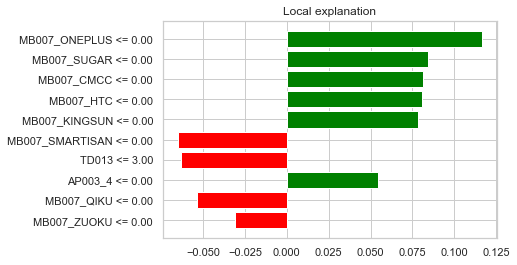

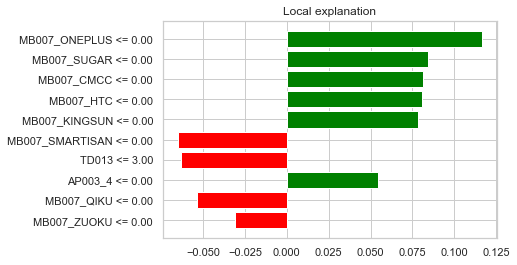

In [154]:
exp = explainer.explain_instance(X_test.iloc[0], model.predict)
exp.as_pyplot_figure()

#### Business Insight:

- Green/Red color: features that have positive correlations with the target are shown in green, otherwise red.

### Coefficients of the LIME model

In [155]:
pd.DataFrame(exp.as_list())

,0,1
0,MB007_ONEPLUS <= 0.00,0.116665
1,MB007_SUGAR <= 0.00,0.084427
2,MB007_CMCC <= 0.00,0.081194
3,MB007_HTC <= 0.00,0.080703
4,MB007_KINGSUN <= 0.00,0.078229
5,MB007_SMARTISAN <= 0.00,-0.065094
6,TD013 <= 3.00,-0.062895
7,AP003_4 <= 0.00,0.054511
8,MB007_QIKU <= 0.00,-0.053453
9,MB007_ZUOKU <= 0.00,-0.031002


### Show all the results in a notebook-like format

In [156]:
exp.show_in_notebook(show_table = True, show_all = False)

#### Observations:

- The LIME model intercept: -0.129,
- The LIME model prediction: “Prediction_local 0.153”
- The original random forest model prediction: “Right: 0.215”.

# Conclusion:

SHAP Values are a very important methodology to understand and explian the variables which result a certain prediction value in a random forest model. 

Three benefits worth mentioning here:
- The first one is global interpretability — the collective SHAP values can show how much each predictor contributes, either positively or negatively, to the target variable. This is like the variable importance plot but it is able to show the positive or negative relationship for each variable with the target (see the SHAP value plot below).
- The second benefit is local interpretability — each observation gets its own set of SHAP values (see the individual SHAP value plot below). This greatly increases its transparency. We can explain why a case receives its prediction and the contributions of the predictors. Traditional variable importance algorithms only show the results across the entire population but not on each individual case. The local interpretability enables us to pinpoint and contrast the impacts of the factors.
- Third, the SHAP values can be calculated for any tree-based model, while other methods use linear regression or logistic regression models as the surrogate models.